In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.fft import fft
import librosa

In [ ]:
audio_file = "/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-1014007643213741626.mp3"

In [ ]:
y,sr = librosa.load(audio_file,sr=None)

## Analysis For Individual Audio

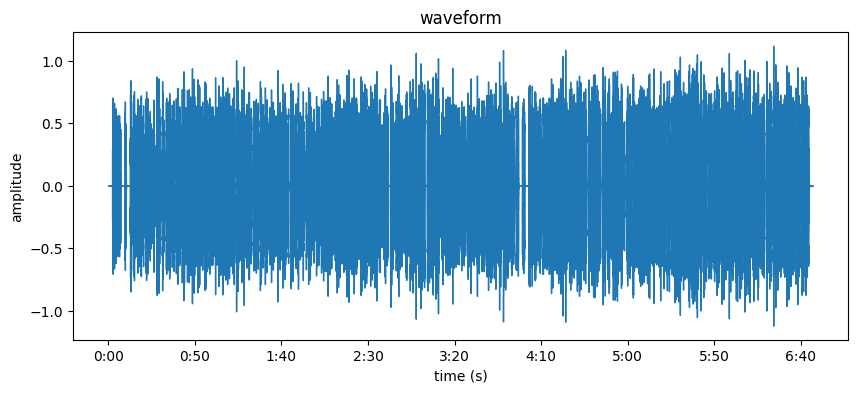

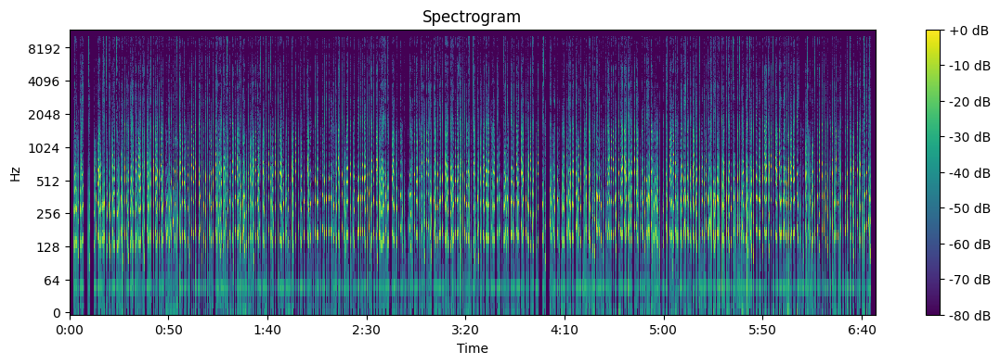

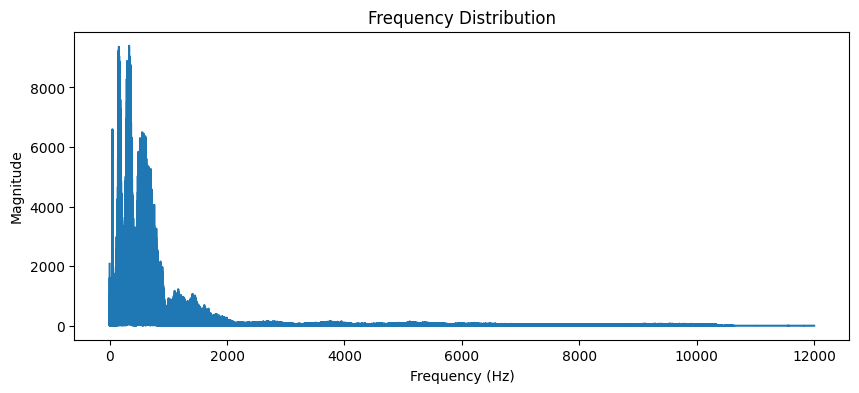

Dominant Frequency: 331.69871983953743 Hz


In [6]:
def plot_spectrogram(y, sr,cmap='viridis'):
    plt.figure(figsize=(14, 4))
    S = librosa.stft(y)
    S_db = librosa.amplitude_to_db(np.abs(S), ref=np.max)
    librosa.display.specshow(S_db, sr=sr, x_axis='time', y_axis='log',cmap=cmap)
    plt.colorbar(format="%+2.0f dB")
    plt.title("Spectrogram")
    plt.show()

def plot_Waveform(y,sr):
    plt.figure(figsize=(10,4))
    librosa.display.waveshow(y,sr=sr)
    plt.title("waveform")
    plt.xlabel("time (s)")
    plt.ylabel("amplitude")


def analyze_frequency_distribution(y, sr):
    freqs = np.fft.rfftfreq(len(y), 1/sr)
    magnitude = np.abs(np.fft.rfft(y))
    plt.figure(figsize=(10, 4))
    plt.plot(freqs, magnitude)
    plt.title("Frequency Distribution")
    plt.xlabel("Frequency (Hz)")
    plt.ylabel("Magnitude")
    plt.show()

    dominant_freq = freqs[np.argmax(magnitude)]
    print(f"Dominant Frequency: {dominant_freq} Hz")
    
    if dominant_freq < 50 or dominant_freq > 3000:
        print("Warning: Unusual dominant frequency detected!")

plot_Waveform(y, sr)
plot_spectrogram(y, sr)
analyze_frequency_distribution(y, sr)



## Anlysis:
### 1. Spectrogram:
*  this is no big gap ,means no long silence in the audio (which is good)

### 2. Frequency distribution
*  majority of signal energy is concentrated under 3000Hz :- w hich is normal human voice range (good for STT and TTS)
*  strong peaks below 1000hz, might be low frequency noise (background or something) ,if noise filtering may remove it
*  weak frequency above 4000hz , might lack sharp, high-pictched elements (TTS may lack generating natural sounding speech)

### 3. Waveform
* no slience segment( or very less) , this can make word segmentation harder for STT(forced alignment tool can be used to avoid that)
* the waveform almost touching the +1,-1, meanning audio might be too loud or over-amplified , clipping may occur ,affecting SST
* sharpe spikes ,this could be due to some artifacts like microphone and all (but waveform alone cannot confirm it)
* since its completely spanning the full length ,we need to trim anything

## Outlier Detection

In [ ]:
import numpy as np
import os
import io
import librosa


def extract_features(y, sr):
    spectral_centroid = np.mean(librosa.feature.spectral_centroid(y=y, sr=sr)) 
    spectral_rolloff = np.mean(librosa.feature.spectral_rolloff(y=y, sr=sr)) 
    rms_energy = np.mean(librosa.feature.rms(y=y))  
    return spectral_centroid, spectral_rolloff, rms_energy

In [5]:
audio_folder = "/kaggle/input/audio-text/SarvamAI/downloaded_audios"
audio_files = [file for file in os.listdir(audio_folder) if file.endswith(".mp3")]

In [6]:
!pip install ffmpeg-python soundfile


valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_7181755412823023655.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-4328272889633962925.mp3
mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_7721534332128477652.mp3


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 52404.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-8118299181335616473.mp3


[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-2899371048425086957.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-7817438513644371232.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_4035472799066169577.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-4992074999088962435.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-4962575987915505463.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-2669211211560492231.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-174106186844422100.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_1677335487030444356.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-5154255684212506559.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_8784808195317711251.mp3


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 55215.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-6601926565739314887.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_6265077620519740640.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-2401836580213047240.mp3
mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_7817362744462566174.mp3


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 49436.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_6735428064268034350.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-5782938819967917724.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_8717977299364397767.mp3
mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-4831975412973665520.mp3


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 55299.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-5082838192008871757.mp3


[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_6626518067565388800.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_7741960830701724510.mp3


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 54696.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-1074254261349375519.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_1760138876266700825.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-7370897424285875333.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_357786617230115740.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_7657284651124933432.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-6601049889177877740.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-8738354639964978253.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-2130806460526484602.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-8020525693325311575.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_9138909480056537679.mp3
valid audio /kaggle/input/audio-text/S

Note: Illegal Audio-MPEG-Header 0x00000000 at offset 56783.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-2732404794880195867.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_9031545222298239486.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_627655812321526439.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-3628938733208771674.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_8774588670861771451.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_6561923571803349612.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_7589781027285394541.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_7006495875561374897.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_2704296443855618939.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-6204059574458448677.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_a

Note: Illegal Audio-MPEG-Header 0x00000000 at offset 48900.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-147978434458181333.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_8730936401633829347.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-3090858765330734193.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-4164839473360723391.mp3
mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_6322345769845212136.mp3


[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_2616386977011990860.mp3
mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-8176552843303427653.mp3


[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-8986316887988608967.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-8447075506436259232.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-5285877180706824085.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_1420428883645932058.mp3
mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-1454204314378738740.mp3


[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-5809371328923647792.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-1664813567378955277.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-8310897517494115740.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-8150626201187163481.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_3164319244738839230.mp3
mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_5245258429734724636.mp3


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 52861.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-8210587613577550943.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_6210838520678064504.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-4250596217392471185.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-858655320530141032.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-73160321462525439.mp3
mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-8198849007707872589.mp3


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 51359.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_4083398143080834180.mp3


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 45316.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-8515052192606256793.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_9166781527700283710.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_6966785491202630200.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-3842384984107162628.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-8498025245752392497.mp3
mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_693926463002788053.mp3


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 52567.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


mahaul pura wavy
mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_7280443313388717084.mp3


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 51224.
Note: Trying to resync...
Note: Hit end of (available) data during resync.
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-1130255847820000883.mp3


[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-520943090291162061.mp3


[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.
Note: Illegal Audio-MPEG-Header 0x00000000 at offset 52742.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


mahaul pura wavy
mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-2998277790104197952.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_4580664048732848320.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_7945472721678451566.mp3
mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_6645323705302974900.mp3


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 44098.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_6498441802377912336.mp3
mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_6598365322637647960.mp3


[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


mahaul pura wavy
mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_8957187754988159425.mp3


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 62386.
Note: Trying to resync...
Note: Hit end of (available) data during resync.
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_4068405469410780115.mp3


[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-424555401634840154.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-6981117078874889196.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-336780674712689986.mp3
mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_8515523953209607312.mp3


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 51090.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_8048192807246446669.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-5980821539169557837.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_6729927456367215310.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_4499528849992991309.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-8431445999114697753.mp3


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 56680.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_1606751663680692398.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-6056710200802762704.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-8241142429557718861.mp3
mahaul pura wavy
mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_4077924615603438047.mp3


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 45834.
Note: Trying to resync...
Note: Hit end of (available) data during resync.
Note: Illegal Audio-MPEG-Header 0x00000000 at offset 52527.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-4368312715531091108.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_5692429944107320529.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-4753297650585812440.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-8307867016366013669.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-966010618211991548.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-7993710021366111363.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_4117376572182905497.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-3208737823623634865.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_2047780618783490777.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_5440176281063580106.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloade

Note: Illegal Audio-MPEG-Header 0x00000000 at offset 58862.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-7962367719970422240.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_2553773566923186754.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_5715898435623797936.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_8997407739801600383.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-1661554790597918687.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-1014007643213741626.mp3
mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-306104207289253313.mp3


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 60068.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-3065151195484019896.mp3


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 52733.
Note: Trying to resync...
Note: Hit end of (available) data during resync.
Note: Illegal Audio-MPEG-Header 0x00000000 at offset 48959.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-2085697633243110787.mp3
mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_7983273050966098142.mp3


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 59075.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_3933151515697619865.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-7621353975080033104.mp3


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 49558.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-8731283870436892661.mp3
mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-1414749757346439106.mp3


[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_4945956106569204512.mp3
mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-5169084128624557081.mp3


[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_758285139570188799.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_6992054641769775699.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-5435133241114844833.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-5358100826420804642.mp3
mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_6701318005135827187.mp3


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 50186.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


mahaul pura wavy
mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_9134735963526455317.mp3


[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.
Note: Illegal Audio-MPEG-Header 0x00000000 at offset 49703.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_4847084717457989818.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-8521508358329646582.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-4257150838690086516.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-2786127893152628164.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-4321349047054679443.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_879689520401187820.mp3
mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_4648100722429961131.mp3


[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_4321049018187818001.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-7349202642186788300.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-4661185780861304184.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-4220221776027114635.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_6492901622145696194.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-1419613405578084194.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-3513326638279515542.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_8109654384526853059.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_1108205764452254542.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-1655471942666001606.mp3
valid audio /kaggle/input/audio-text/SarvamAI/download

Note: Illegal Audio-MPEG-Header 0x00000000 at offset 50398.
Note: Trying to resync...
Note: Hit end of (available) data during resync.
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-7050633072816349074.mp3


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 60038.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-5612019907852869387.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-5346853420036758871.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_4031963927011090829.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_3297970902692168301.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-2504112055736336067.mp3


[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_6613828316324839653.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-4472066442360585739.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-2565768523052662742.mp3
mahaul pura wavy
mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-3520900037041183646.mp3


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 50983.
Note: Trying to resync...
Note: Hit end of (available) data during resync.
Note: Illegal Audio-MPEG-Header 0x00000000 at offset 50277.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_7264989092879679644.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-1047219037668523916.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-4679338477218553253.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-7810409654436396219.mp3
mahaul pura wavy
mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_6876515120964034887.mp3


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 59559.
Note: Trying to resync...
Note: Hit end of (available) data during resync.
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_1291534558366056609.mp3
mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-762016289653316415.mp3


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 54187.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_9207128780738552165.mp3
mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_3327246780875973708.mp3


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 58210.
Note: Trying to resync...
Note: Hit end of (available) data during resync.
Note: Illegal Audio-MPEG-Header 0x00000000 at offset 56773.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_532482715063886207.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-2510418576280427323.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-8988434362681162961.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-2274734930692308620.mp3
mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_1041996799513297731.mp3


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 55153.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_7758574694889455706.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_3281629119366177050.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-5713399835812166986.mp3
mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-1292205046836600162.mp3


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 57823.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-1687474254318362297.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-1306345190648135157.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-3674162428609887112.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-2744186389366783424.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-8033856149157485601.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_3992937580536496766.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_3404087058372575952.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_563009029136606403.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_3038071892151887054.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_6574091937974411930.mp3
mahaul pura wavy
valid audio /kaggle/input/audio-text/Sa

[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_2148784922536690268.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_2715477169873650452.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_8567369135867093404.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-7283321606059269357.mp3
mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_6704950619162173960.mp3


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 49012.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_4913782570855867494.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-7927335091336921002.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-4077651344865435028.mp3
mahaul pura wavy
mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_8475098247655342273.mp3


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 57015.
Note: Trying to resync...
Note: Hit end of (available) data during resync.
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-2422338071324638858.mp3


[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_1988787495001612332.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_2540671023264383612.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-8960567728295378257.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-614993359517720051.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-8294479870191623926.mp3
mahaul pura wavy
mahaul pura wavy
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-3408554182482451605.mp3


[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_5925577609898173269.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-5333647794986007489.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_1300742068119306362.mp3
valid audio /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-3939980673532353741.mp3
Invalid outlier /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-5154255684212506559.mp3


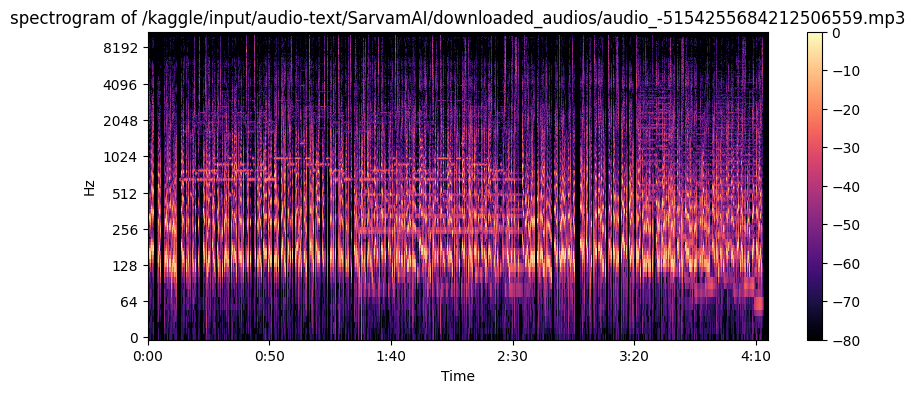

Invalid outlier /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-5082838192008871757.mp3


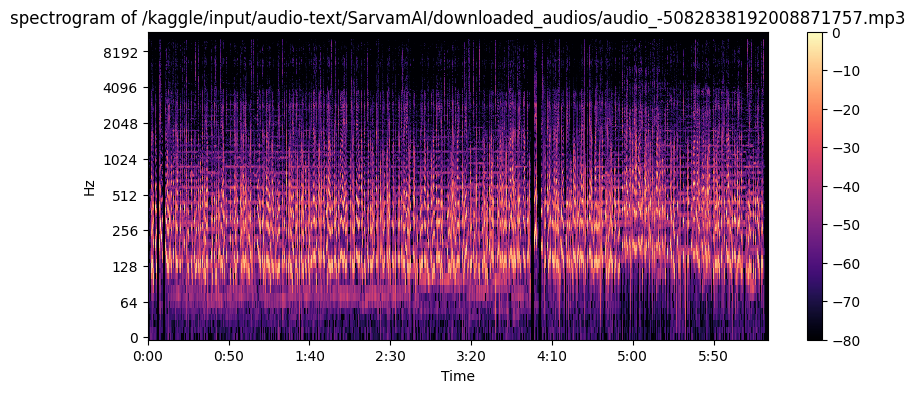

Invalid outlier /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-8738354639964978253.mp3


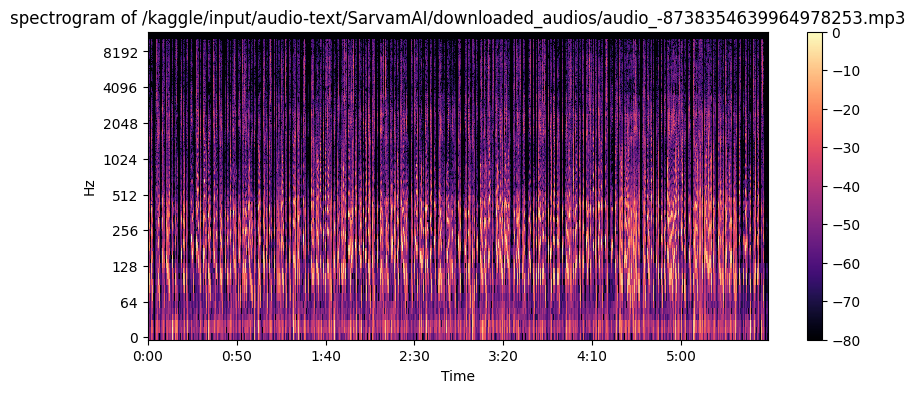

Invalid outlier /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_4262872954250314313.mp3


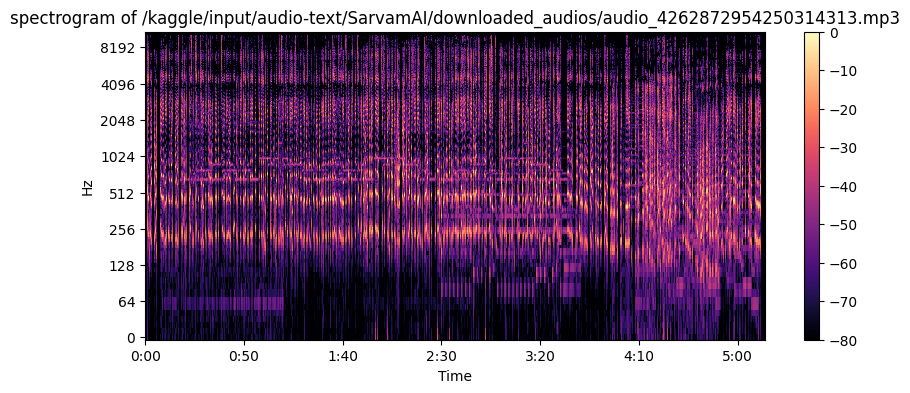

Invalid outlier /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-379091926249864962.mp3


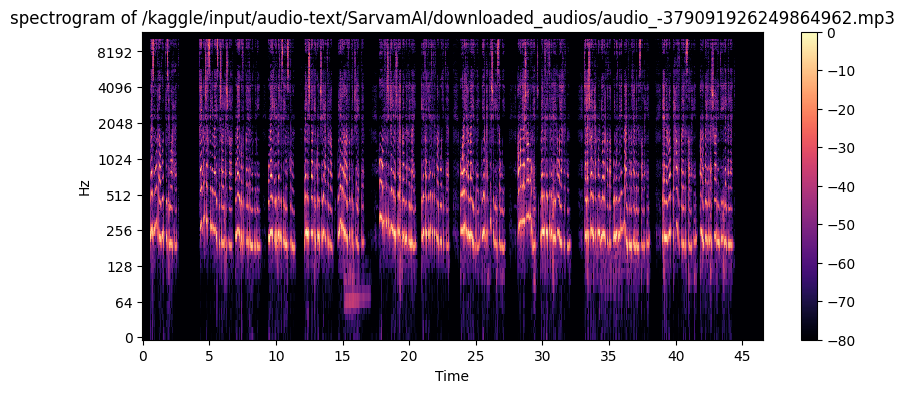

Invalid outlier /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_6322345769845212136.mp3


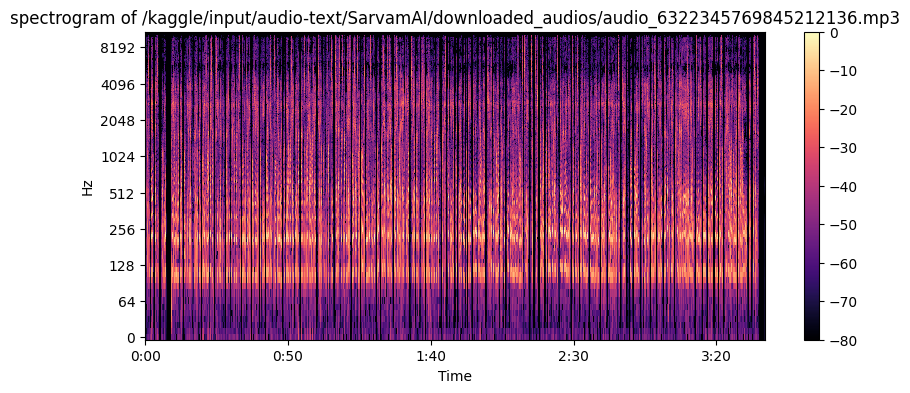

Invalid outlier /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-5809371328923647792.mp3


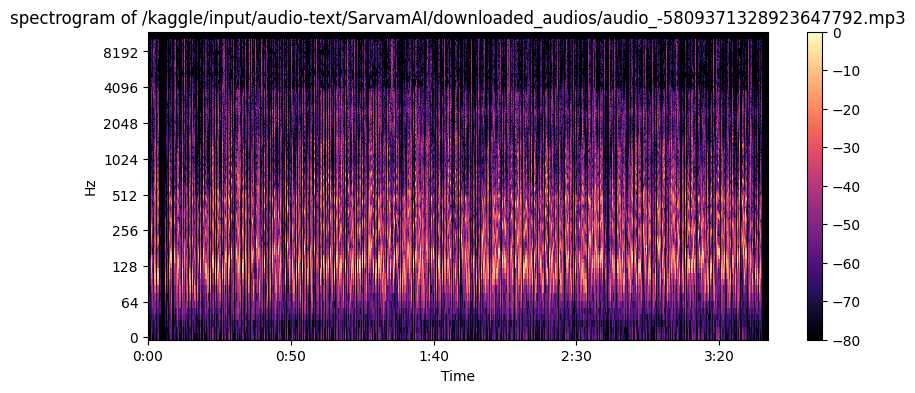

Invalid outlier /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-8150626201187163481.mp3


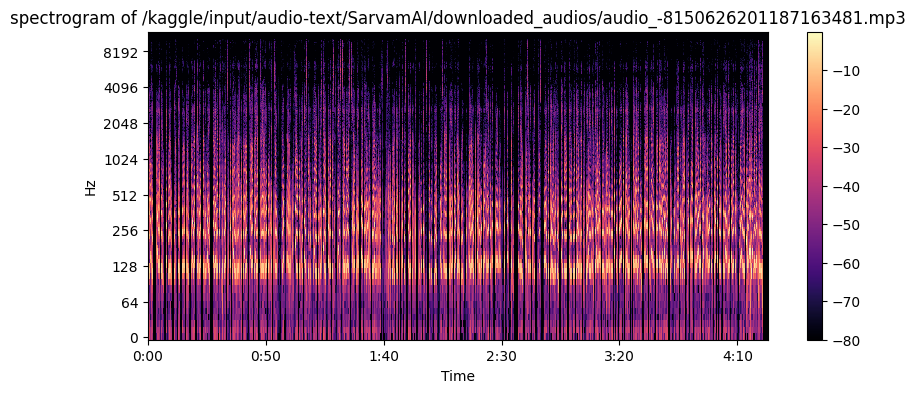

Invalid outlier /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_6210838520678064504.mp3


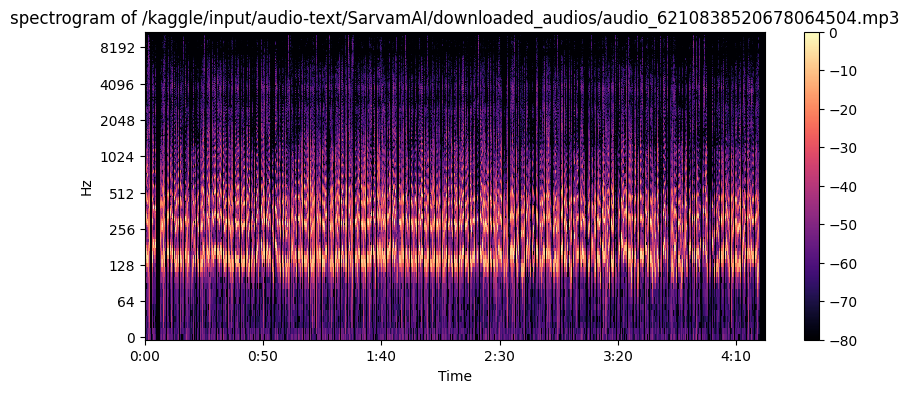

Invalid outlier /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-8515052192606256793.mp3


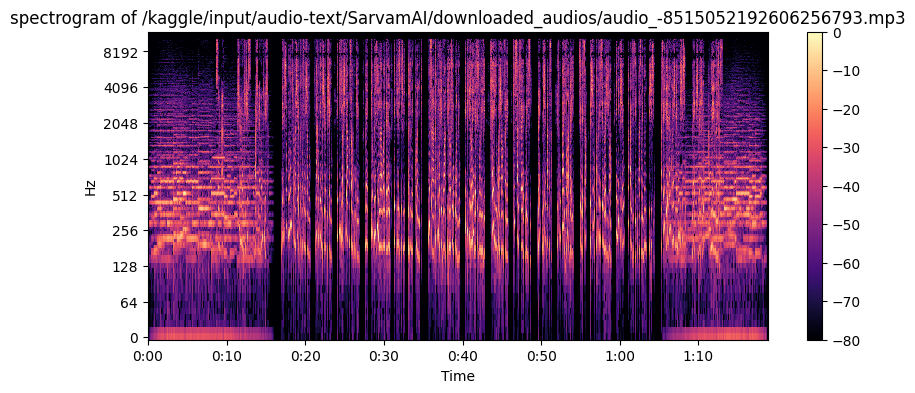

Invalid outlier /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_4068405469410780115.mp3


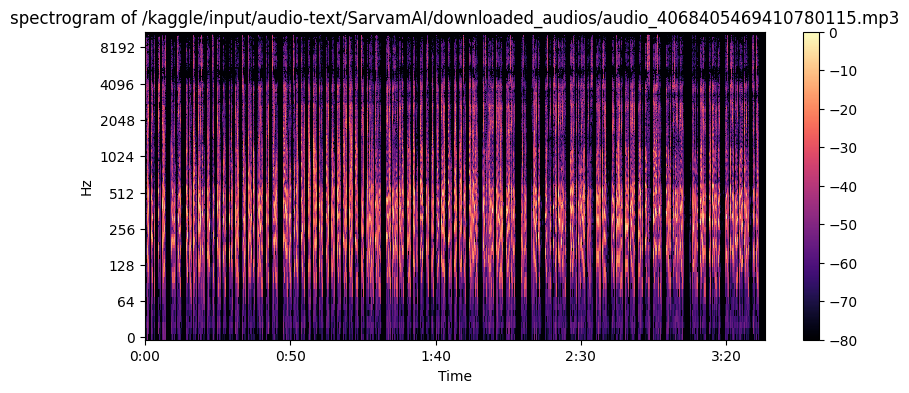

Invalid outlier /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_8048192807246446669.mp3


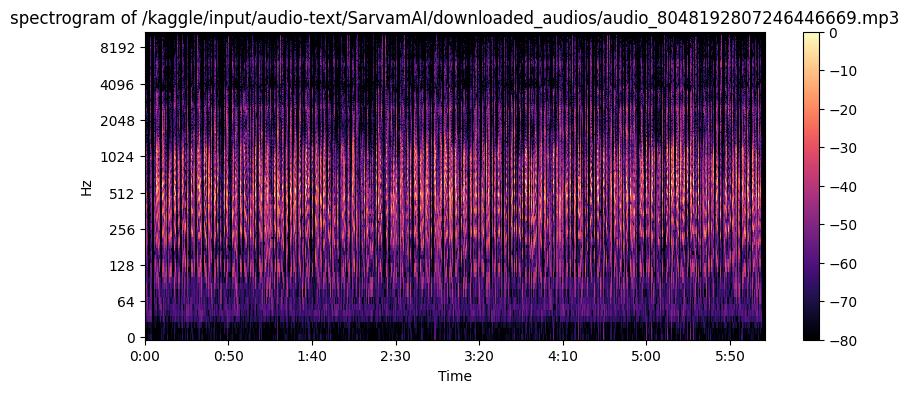

Invalid outlier /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_3933151515697619865.mp3


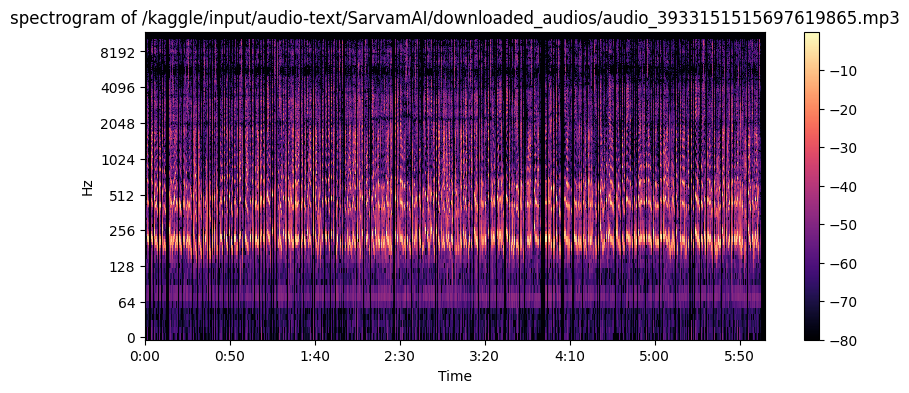

Invalid outlier /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-5358100826420804642.mp3


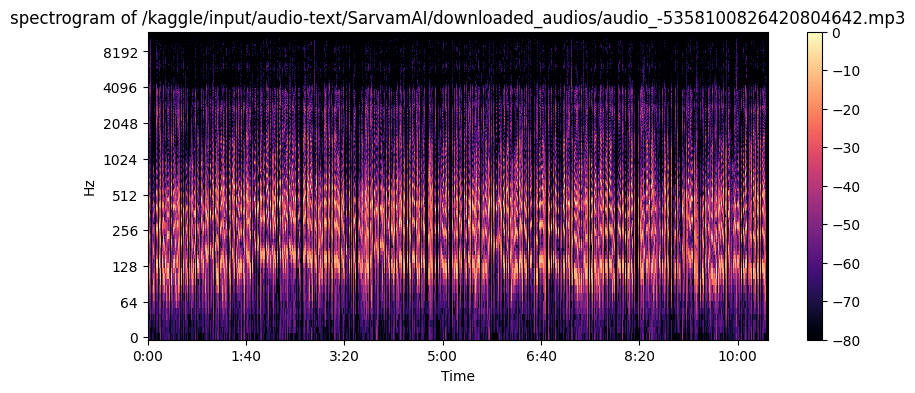

Invalid outlier /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_9134735963526455317.mp3


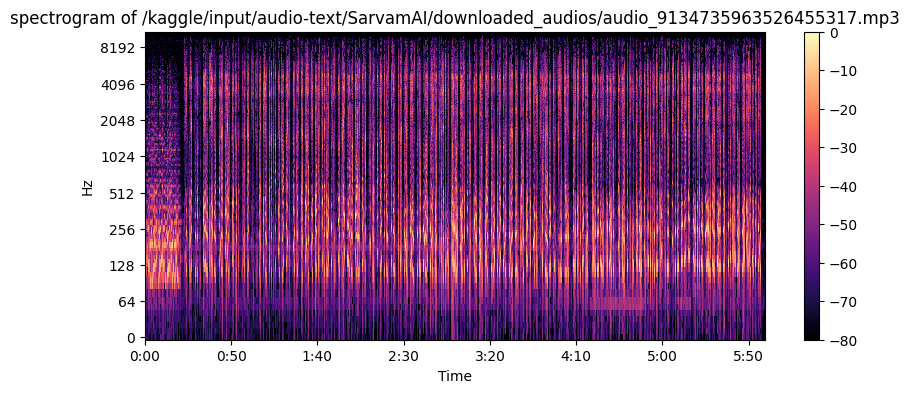

Invalid outlier /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_879689520401187820.mp3


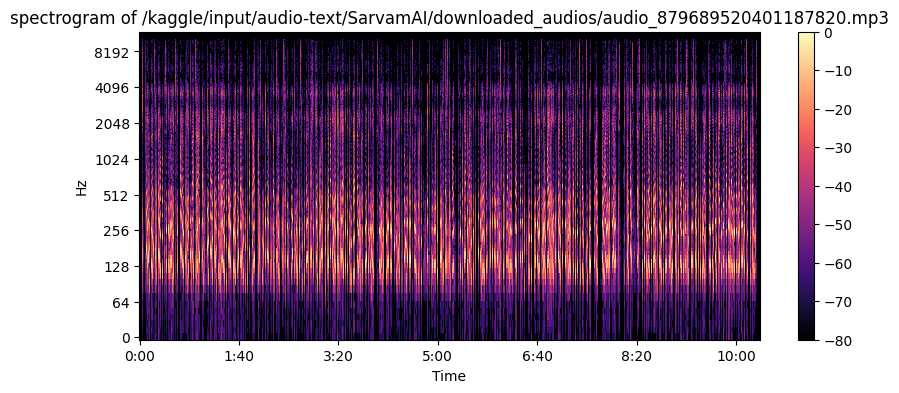

Invalid outlier /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-1655471942666001606.mp3


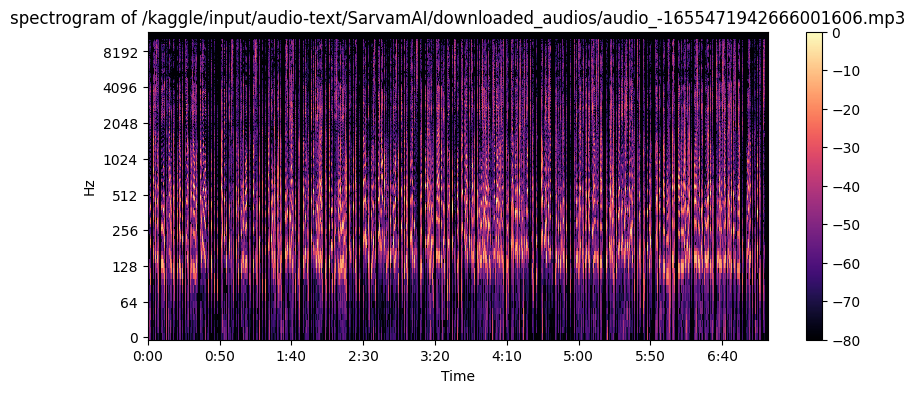

Invalid outlier /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_3297970902692168301.mp3


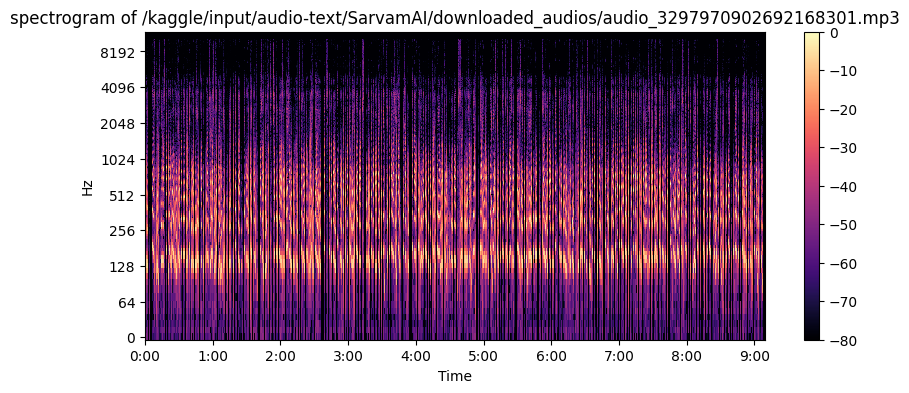

Invalid outlier /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-3520900037041183646.mp3


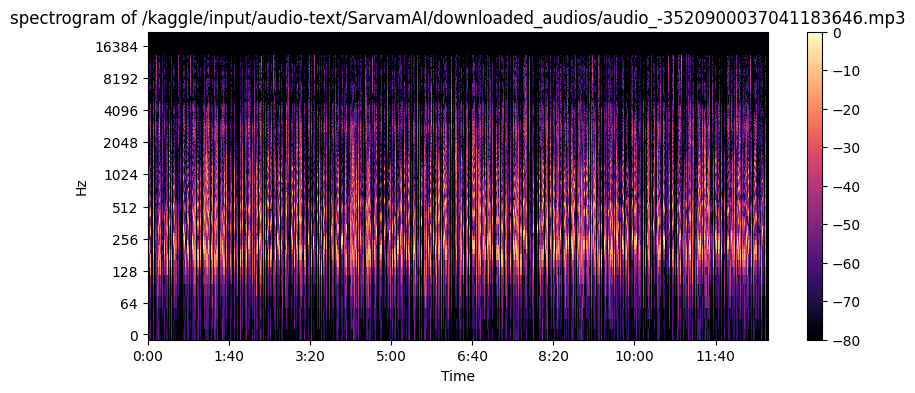

Invalid outlier /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_3327246780875973708.mp3


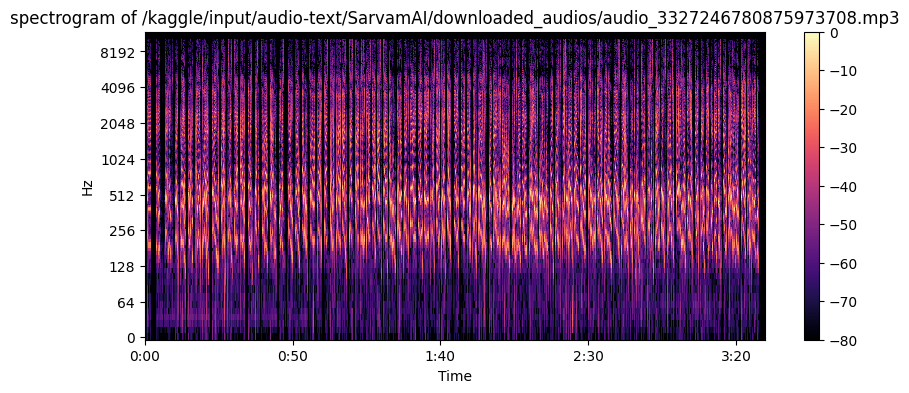

Invalid outlier /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_3281629119366177050.mp3


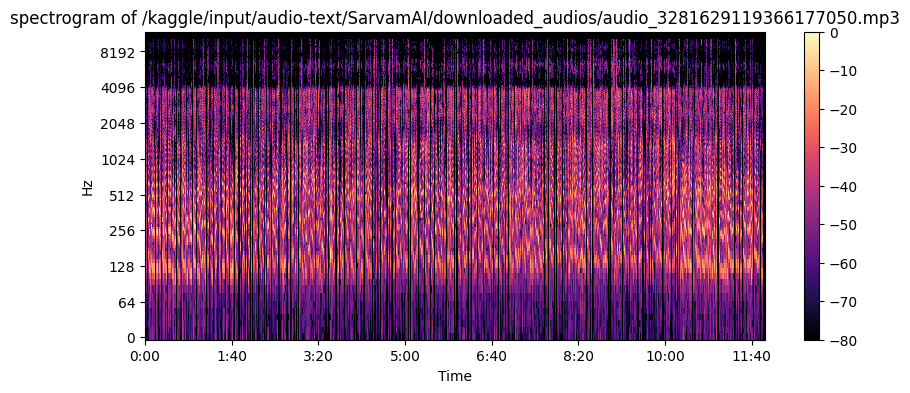

Invalid outlier /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_6574091937974411930.mp3


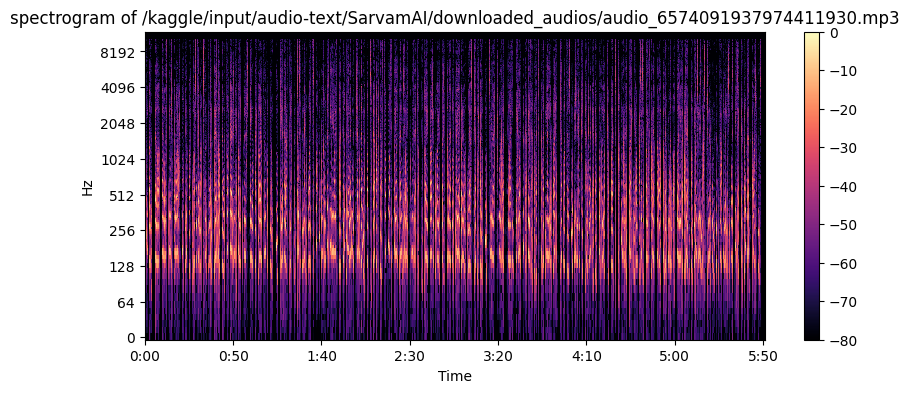

Invalid outlier /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_1962541459114549420.mp3


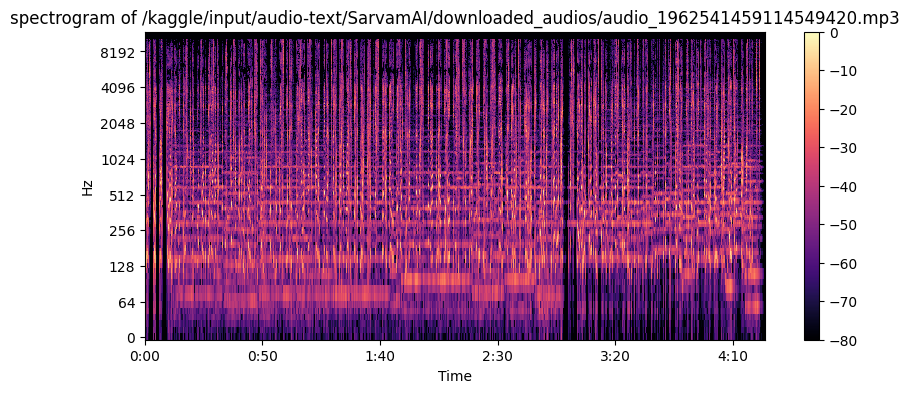

Invalid outlier /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_4913782570855867494.mp3


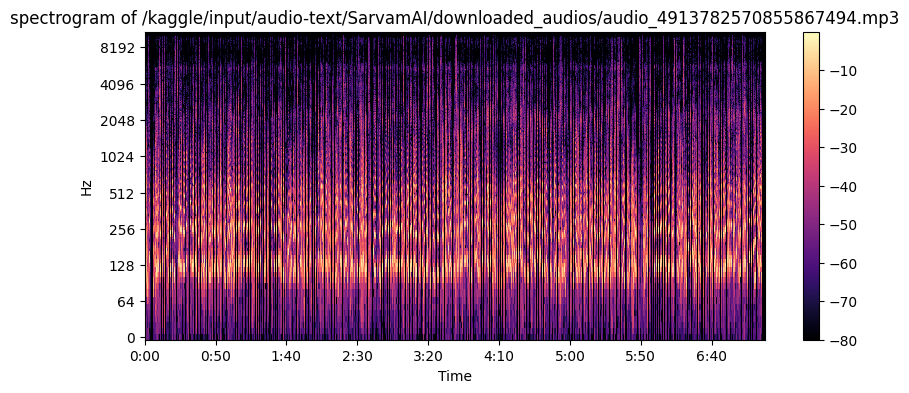

Invalid outlier /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-614993359517720051.mp3


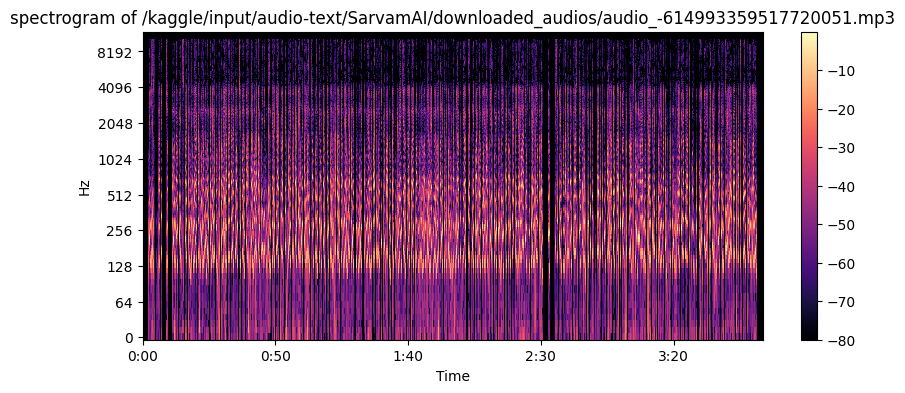

In [8]:
import os
import librosa
import librosa.display
import soundfile as sf
import numpy as np
import matplotlib.pyplot as plt

file_list = []
feature_list = []

for file in audio_files:
    file_path = os.path.join(audio_folder, file)

    try:
        with sf.SoundFile(file_path) as sf_desc:
            print(f"valid audio {file_path}")
        y, sr = librosa.load(file_path, sr=None)

        features = extract_features(y, sr)
        file_list.append(file)
        feature_list.append(features)
    except Exception as e:
        print(f"mahaul pura wavy")

if feature_list:
    feature_array = np.array(feature_list)
else:
    print("no valid features extracted")
    feature_array = np.array([])

if feature_array.size > 0:
    mean_values = np.mean(feature_array, axis=0)
    std_values = np.std(feature_array, axis=0)

    outliers = []

    for file, features in zip(file_list, feature_array):
        if any(abs(features - mean_values) > 2 * std_values):
            outliers.append(file)
            new_file = os.path.join(audio_folder, file)
            with sf.SoundFile(new_file) as sf_desc:
                print(f"Invalid outlier {new_file}")

            y, sr = librosa.load(new_file, sr=None)
            S = librosa.stft(y)
            S_db = librosa.amplitude_to_db(np.abs(S), ref=np.max)

            plt.figure(figsize=(10, 4))
            librosa.display.specshow(S_db, sr=sr, x_axis="time", y_axis="log")
            plt.colorbar()
            plt.title(f"spectrogram of {new_file}")
            plt.show()
else:
    print("khatm tata bye bye")


# Checking Audio Quality

In [9]:
pip install pypesq pystoi

Note: you may need to restart the kernel to use updated packages.


In [10]:
from pypesq import pesq
from pystoi import stoi
import os
import librosa
import librosa.display
import soundfile as sf
import numpy as np
import matplotlib.pyplot as plt

In [11]:
def compute_snr(y):
    rms_signal = np.sqrt(np.mean(y**2))
    rms_noise = np.percentile(np.abs(y),10)
    snr_db = 20* np.log10(rms_signal / (rms_noise + 1e-10))
    return snr_db

def compute_thd(y):
    y_harm = librosa.effects.harmonic(y)
    y_perc = librosa.effects.percussive(y)
    power_harm = np.sum(y_harm ** 2)
    power_perc = np.sum(y_perc ** 2)
    thd_db = 10 * np.log10(power_perc / (power_harm + 1e-10))
    return thd_db

def compute_frequency_response(y,sr,n_fft=2048):
    S = np.abs(librosa.stft(y, n_fft=n_fft))
    avg_magnitude = np.mean(S, axis=1)
    freqs = np.linspace(0, sr/2, len(avg_magnitude))
    return freqs, avg_magnitude

def compute_perceptual_metrics(y,sr,ref,ref_sr):
    min_len = min(len(y), len(ref))
    y = y[:min_len]
    ref = ref[:min_len]
    pesq_score = pesq(ref, y, sr)  # PESQ score (ITU-T PESQ score)
    stoi_score = stoi(ref, y, sr, extended=False)
    return pesq_score, stoi_score
    
    

In [12]:
snr_list = []
thd_list = []
freq_resp_list = []
pesq_list = []
filenames = []

for file in audio_files:
    file_path = os.path.join(audio_folder, file)
    try:
        with sf.SoundFile(file_path) as sf_desc:
            bit_depth = sf_desc.subtype
            print(f"Processing: {file_path} with bit depth {bit_depth}")

        y, sr = librosa.load(file_path, sr=None)
        snr_val = compute_snr(y)
        thd_val = compute_thd(y)
        freqs, avg_magnitude = compute_frequency_response(y, sr)

        snr_list.append(snr_val)
        thd_list.append(thd_val)
        freq_resp_list.append((freqs, avg_magnitude))
        filenames.append(file)
    except Exception as e:
        print(f"Error processing {file}: {e}")


Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_7181755412823023655.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-4328272889633962925.mp3 with bit depth MPEG_LAYER_III


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 52404.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


Error processing audio_3055626065964220680.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_3055626065964220680.mp3': File does not exist or is not a regular file (possibly a pipe?).
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_7721534332128477652.mp3 with bit depth MPEG_LAYER_III
Error processing audio_6201942200267260987.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_6201942200267260987.mp3': File does not exist or is not a regular file (possibly a pipe?).
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-8118299181335616473.mp3 with bit depth MPEG_LAYER_III


[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-2899371048425086957.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-7817438513644371232.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_4035472799066169577.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-4992074999088962435.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-4962575987915505463.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-2669211211560492231.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-174106186844422100.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_1677335487030444356.mp3 with bit depth MPEG_LAYER_III
Pro

Note: Illegal Audio-MPEG-Header 0x00000000 at offset 55215.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_6265077620519740640.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-2401836580213047240.mp3 with bit depth MPEG_LAYER_III
Error processing audio_2114960552832255205.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_2114960552832255205.mp3': File does not exist or is not a regular file (possibly a pipe?).
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_7817362744462566174.mp3 with bit depth MPEG_LAYER_III


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 49436.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_6735428064268034350.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-5782938819967917724.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_8717977299364397767.mp3 with bit depth MPEG_LAYER_III
Error processing audio_9074853615365088387.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_9074853615365088387.mp3': File does not exist or is not a regular file (possibly a pipe?).
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-4831975412973665520.mp3 with bit depth MPEG_LAYER_III


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 55299.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


Error processing audio_1361103528684421729.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_1361103528684421729.mp3': File does not exist or is not a regular file (possibly a pipe?).
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-5082838192008871757.mp3 with bit depth MPEG_LAYER_III


[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_6626518067565388800.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_7741960830701724510.mp3 with bit depth MPEG_LAYER_III
Error processing audio_8256977327724683424.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_8256977327724683424.mp3': File does not exist or is not a regular file (possibly a pipe?).
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-1074254261349375519.mp3 with bit depth MPEG_LAYER_III


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 54696.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_1760138876266700825.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-7370897424285875333.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_357786617230115740.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_7657284651124933432.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-6601049889177877740.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-8738354639964978253.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-2130806460526484602.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-8020525693325311575.mp3 with bit depth MPEG_LAYER_III
Proc

Note: Illegal Audio-MPEG-Header 0x00000000 at offset 56783.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-2732404794880195867.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_9031545222298239486.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_627655812321526439.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-3628938733208771674.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_8774588670861771451.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_6561923571803349612.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_7589781027285394541.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_7006495875561374897.mp3 with bit depth MPEG_LAYER_III
Process

Note: Illegal Audio-MPEG-Header 0x00000000 at offset 48900.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-147978434458181333.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_8730936401633829347.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-3090858765330734193.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-4164839473360723391.mp3 with bit depth MPEG_LAYER_III
Error processing audio_-3352533766232906877.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-3352533766232906877.mp3': File does not exist or is not a regular file (possibly a pipe?).
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_6322345769845212136.mp3 with bit depth MPEG_LAYER_III


[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_2616386977011990860.mp3 with bit depth MPEG_LAYER_III
Error processing audio_-1950700085145731052.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-1950700085145731052.mp3': File does not exist or is not a regular file (possibly a pipe?).
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-8176552843303427653.mp3 with bit depth MPEG_LAYER_III


[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-8986316887988608967.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-8447075506436259232.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-5285877180706824085.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_1420428883645932058.mp3 with bit depth MPEG_LAYER_III
Error processing audio_2083843301095015025.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_2083843301095015025.mp3': File does not exist or is not a regular file (possibly a pipe?).
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-1454204314378738740.mp3 with bit depth MPEG_LAYER_III


[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-5809371328923647792.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-1664813567378955277.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-8310897517494115740.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-8150626201187163481.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_3164319244738839230.mp3 with bit depth MPEG_LAYER_III


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 52861.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


Error processing audio_7668867017054322871.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_7668867017054322871.mp3': File does not exist or is not a regular file (possibly a pipe?).
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_5245258429734724636.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-8210587613577550943.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_6210838520678064504.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-4250596217392471185.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-858655320530141032.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-73160321462525439.mp3 with bit depth MPEG_LAYER_III
Error processing audio_6200831649611891881.

Note: Illegal Audio-MPEG-Header 0x00000000 at offset 51359.
Note: Trying to resync...
Note: Hit end of (available) data during resync.
Note: Illegal Audio-MPEG-Header 0x00000000 at offset 45316.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


Error processing audio_-3095041755739200301.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-3095041755739200301.mp3': File does not exist or is not a regular file (possibly a pipe?).
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_4083398143080834180.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-8515052192606256793.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_9166781527700283710.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_6966785491202630200.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-3842384984107162628.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-8498025245752392497.mp3 with bit depth MPEG_LAYER_III
Error processing audio_1400344911431850

Note: Illegal Audio-MPEG-Header 0x00000000 at offset 52567.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


Error processing audio_-4960493667688914405.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-4960493667688914405.mp3': File does not exist or is not a regular file (possibly a pipe?).
Error processing audio_2607909614689133758.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_2607909614689133758.mp3': File does not exist or is not a regular file (possibly a pipe?).
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_7280443313388717084.mp3 with bit depth MPEG_LAYER_III


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 51224.
Note: Trying to resync...
Note: Hit end of (available) data during resync.
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


Error processing audio_6521916532372759651.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_6521916532372759651.mp3': File does not exist or is not a regular file (possibly a pipe?).
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-1130255847820000883.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-520943090291162061.mp3 with bit depth MPEG_LAYER_III
Error processing audio_-745876134296100784.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-745876134296100784.mp3': File does not exist or is not a regular file (possibly a pipe?).
Error processing audio_71160571488092604.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_71160571488092604.mp3': File does not exist or is not a regular file (possibly a pipe?).
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-2998277790104197952.mp3 with bit depth MPEG_LAYE

[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.
Note: Illegal Audio-MPEG-Header 0x00000000 at offset 52742.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_4580664048732848320.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_7945472721678451566.mp3 with bit depth MPEG_LAYER_III


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 44098.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


Error processing audio_4023268650329793063.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_4023268650329793063.mp3': File does not exist or is not a regular file (possibly a pipe?).
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_6645323705302974900.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_6498441802377912336.mp3 with bit depth MPEG_LAYER_III
Error processing audio_-6578296120774425892.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-6578296120774425892.mp3': File does not exist or is not a regular file (possibly a pipe?).
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_6598365322637647960.mp3 with bit depth MPEG_LAYER_III


[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


Error processing audio_-7042774794638901086.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-7042774794638901086.mp3': File does not exist or is not a regular file (possibly a pipe?).
Error processing audio_-6515146767325748464.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-6515146767325748464.mp3': File does not exist or is not a regular file (possibly a pipe?).
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_8957187754988159425.mp3 with bit depth MPEG_LAYER_III


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 62386.
Note: Trying to resync...
Note: Hit end of (available) data during resync.
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


Error processing audio_-7133236395561917882.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-7133236395561917882.mp3': File does not exist or is not a regular file (possibly a pipe?).
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_4068405469410780115.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-424555401634840154.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-6981117078874889196.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-336780674712689986.mp3 with bit depth MPEG_LAYER_III
Error processing audio_-3104862507065121947.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-3104862507065121947.mp3': File does not exist or is not a regular file (possibly a pipe?).
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_85155

Note: Illegal Audio-MPEG-Header 0x00000000 at offset 51090.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_8048192807246446669.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-5980821539169557837.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_6729927456367215310.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_4499528849992991309.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-8431445999114697753.mp3 with bit depth MPEG_LAYER_III


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 56680.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


Error processing audio_9154835413273199362.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_9154835413273199362.mp3': File does not exist or is not a regular file (possibly a pipe?).
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_1606751663680692398.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-6056710200802762704.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-8241142429557718861.mp3 with bit depth MPEG_LAYER_III
Error processing audio_3359209873589248685.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_3359209873589248685.mp3': File does not exist or is not a regular file (possibly a pipe?).
Error processing audio_-231579968178462286.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-231579968178462286.mp3': File does not exist or is not a regular file (possibly 

Note: Illegal Audio-MPEG-Header 0x00000000 at offset 45834.
Note: Trying to resync...
Note: Hit end of (available) data during resync.
Note: Illegal Audio-MPEG-Header 0x00000000 at offset 52527.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-4368312715531091108.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_5692429944107320529.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-4753297650585812440.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-8307867016366013669.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-966010618211991548.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-7993710021366111363.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_4117376572182905497.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-3208737823623634865.mp3 with bit depth MPEG_LAYER_III
Pro

Note: Illegal Audio-MPEG-Header 0x00000000 at offset 58862.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


Error processing audio_4922361700555260445.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_4922361700555260445.mp3': File does not exist or is not a regular file (possibly a pipe?).
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-6836709713204690008.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-7962367719970422240.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_2553773566923186754.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_5715898435623797936.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_8997407739801600383.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-1661554790597918687.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/Sarv

Note: Illegal Audio-MPEG-Header 0x00000000 at offset 60068.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


Error processing audio_1615742734336205676.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_1615742734336205676.mp3': File does not exist or is not a regular file (possibly a pipe?).
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-3065151195484019896.mp3 with bit depth MPEG_LAYER_III


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 52733.
Note: Trying to resync...
Note: Hit end of (available) data during resync.
Note: Illegal Audio-MPEG-Header 0x00000000 at offset 48959.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


Error processing audio_-6960655131989121921.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-6960655131989121921.mp3': File does not exist or is not a regular file (possibly a pipe?).
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-2085697633243110787.mp3 with bit depth MPEG_LAYER_III
Error processing audio_-6341007357276150759.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-6341007357276150759.mp3': File does not exist or is not a regular file (possibly a pipe?).
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_7983273050966098142.mp3 with bit depth MPEG_LAYER_III


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 59075.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_3933151515697619865.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-7621353975080033104.mp3 with bit depth MPEG_LAYER_III
Error processing audio_-2357850246622428798.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-2357850246622428798.mp3': File does not exist or is not a regular file (possibly a pipe?).
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-8731283870436892661.mp3 with bit depth MPEG_LAYER_III


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 49558.
Note: Trying to resync...
Note: Hit end of (available) data during resync.
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


Error processing audio_8932830097930584667.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_8932830097930584667.mp3': File does not exist or is not a regular file (possibly a pipe?).
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-1414749757346439106.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_4945956106569204512.mp3 with bit depth MPEG_LAYER_III
Error processing audio_-2889312945744215913.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-2889312945744215913.mp3': File does not exist or is not a regular file (possibly a pipe?).
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-5169084128624557081.mp3 with bit depth MPEG_LAYER_III


[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


Error processing audio_-5491136357610233763.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-5491136357610233763.mp3': File does not exist or is not a regular file (possibly a pipe?).
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_758285139570188799.mp3 with bit depth MPEG_LAYER_III


[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_6992054641769775699.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-5435133241114844833.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-5358100826420804642.mp3 with bit depth MPEG_LAYER_III


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 50186.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


Error processing audio_2978157595143357115.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_2978157595143357115.mp3': File does not exist or is not a regular file (possibly a pipe?).
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_6701318005135827187.mp3 with bit depth MPEG_LAYER_III
Error processing audio_-5295868014944616208.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-5295868014944616208.mp3': File does not exist or is not a regular file (possibly a pipe?).
Error processing audio_2308953738595934564.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_2308953738595934564.mp3': File does not exist or is not a regular file (possibly a pipe?).
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_9134735963526455317.mp3 with bit depth MPEG_LAYER_III


[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.
Note: Illegal Audio-MPEG-Header 0x00000000 at offset 49703.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_4847084717457989818.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-8521508358329646582.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-4257150838690086516.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-2786127893152628164.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-4321349047054679443.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_879689520401187820.mp3 with bit depth MPEG_LAYER_III
Error processing audio_-2338117061902433248.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-2338117061902433248.mp3': File does not exist or is not a regular file (possibly a pipe?).
Processing: /kaggle/input/audio-text/Sa

[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_4321049018187818001.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-7349202642186788300.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-4661185780861304184.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-4220221776027114635.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_6492901622145696194.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-1419613405578084194.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-3513326638279515542.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_8109654384526853059.mp3 with bit depth MPEG_LAYER_III
Pro

Note: Illegal Audio-MPEG-Header 0x00000000 at offset 50398.
Note: Trying to resync...
Note: Hit end of (available) data during resync.
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


Error processing audio_8203503600707830838.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_8203503600707830838.mp3': File does not exist or is not a regular file (possibly a pipe?).
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-7050633072816349074.mp3 with bit depth MPEG_LAYER_III


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 60038.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-5612019907852869387.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-5346853420036758871.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_4031963927011090829.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_3297970902692168301.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-2504112055736336067.mp3 with bit depth MPEG_LAYER_III
Error processing audio_-3347006761165167899.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-3347006761165167899.mp3': File does not exist or is not a regular file (possibly a pipe?).
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_6613828316324839653.mp3 with bit depth MPEG_LAYER_III


[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-4472066442360585739.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-2565768523052662742.mp3 with bit depth MPEG_LAYER_III
Error processing audio_-3944063862072065559.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-3944063862072065559.mp3': File does not exist or is not a regular file (possibly a pipe?).
Error processing audio_7675543163297964884.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_7675543163297964884.mp3': File does not exist or is not a regular file (possibly a pipe?).
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-3520900037041183646.mp3 with bit depth MPEG_LAYER_III


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 50983.
Note: Trying to resync...
Note: Hit end of (available) data during resync.
Note: Illegal Audio-MPEG-Header 0x00000000 at offset 50277.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_7264989092879679644.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-1047219037668523916.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-4679338477218553253.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-7810409654436396219.mp3 with bit depth MPEG_LAYER_III


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 59559.
Note: Trying to resync...
Note: Hit end of (available) data during resync.
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


Error processing audio_-1908770699491245647.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-1908770699491245647.mp3': File does not exist or is not a regular file (possibly a pipe?).
Error processing audio_-2680736981901704169.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-2680736981901704169.mp3': File does not exist or is not a regular file (possibly a pipe?).
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_6876515120964034887.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_1291534558366056609.mp3 with bit depth MPEG_LAYER_III


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 54187.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


Error processing audio_-3523247015820926507.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-3523247015820926507.mp3': File does not exist or is not a regular file (possibly a pipe?).
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-762016289653316415.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_9207128780738552165.mp3 with bit depth MPEG_LAYER_III


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 58210.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


Error processing audio_3185943364715840116.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_3185943364715840116.mp3': File does not exist or is not a regular file (possibly a pipe?).
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_3327246780875973708.mp3 with bit depth MPEG_LAYER_III


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 56773.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


Error processing audio_-464095003686698765.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-464095003686698765.mp3': File does not exist or is not a regular file (possibly a pipe?).
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_532482715063886207.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-2510418576280427323.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-8988434362681162961.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-2274734930692308620.mp3 with bit depth MPEG_LAYER_III
Error processing audio_3167309693701005925.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_3167309693701005925.mp3': File does not exist or is not a regular file (possibly a pipe?).
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_10419967

Note: Illegal Audio-MPEG-Header 0x00000000 at offset 55153.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_7758574694889455706.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_3281629119366177050.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-5713399835812166986.mp3 with bit depth MPEG_LAYER_III


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 57823.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


Error processing audio_-612369030143499985.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-612369030143499985.mp3': File does not exist or is not a regular file (possibly a pipe?).
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-1292205046836600162.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-1687474254318362297.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-1306345190648135157.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-3674162428609887112.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-2744186389366783424.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-8033856149157485601.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/S

[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_2148784922536690268.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_2715477169873650452.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_8567369135867093404.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-7283321606059269357.mp3 with bit depth MPEG_LAYER_III


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 49012.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


Error processing audio_-7951920952238661574.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-7951920952238661574.mp3': File does not exist or is not a regular file (possibly a pipe?).
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_6704950619162173960.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_4913782570855867494.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-7927335091336921002.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-4077651344865435028.mp3 with bit depth MPEG_LAYER_III
Error processing audio_6447559289313141106.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_6447559289313141106.mp3': File does not exist or is not a regular file (possibly a pipe?).
Error processing audio_-107666289056021592.mp3: Error opening '/kaggle/input

Note: Illegal Audio-MPEG-Header 0x00000000 at offset 57015.
Note: Trying to resync...
Note: Hit end of (available) data during resync.
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-2422338071324638858.mp3 with bit depth MPEG_LAYER_III


[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


Error processing audio_7199420537668199644.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_7199420537668199644.mp3': File does not exist or is not a regular file (possibly a pipe?).
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_1988787495001612332.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_2540671023264383612.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-8960567728295378257.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-614993359517720051.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-8294479870191623926.mp3 with bit depth MPEG_LAYER_III
Error processing audio_-3709033921475280803.mp3: Error opening '/kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-3709033921475280803.mp3': File does not exi

[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_5925577609898173269.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-5333647794986007489.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_1300742068119306362.mp3 with bit depth MPEG_LAYER_III
Processing: /kaggle/input/audio-text/SarvamAI/downloaded_audios/audio_-3939980673532353741.mp3 with bit depth MPEG_LAYER_III


Text(0, 0.5, 'SNR (dB)')

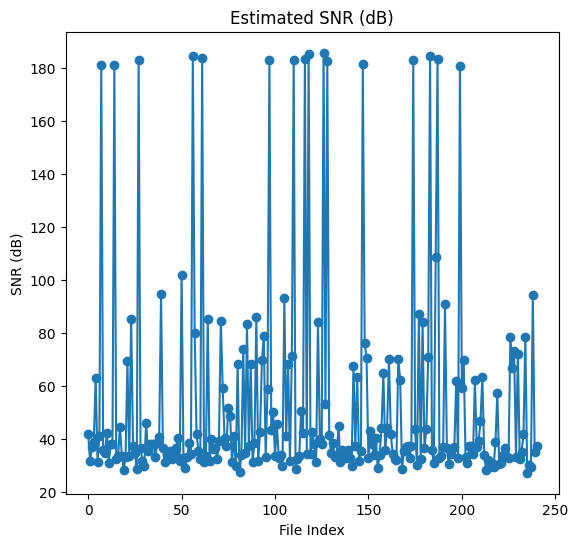

In [13]:
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
plt.plot(snr_list, 'o-')
plt.title("Estimated SNR (dB)")
plt.xlabel("File Index")
plt.ylabel("SNR (dB)")

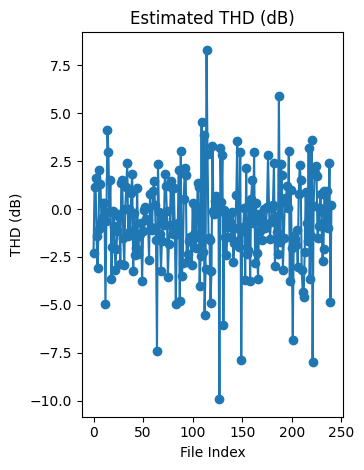

In [14]:
plt.subplot(1, 2, 2)
plt.plot(thd_list, 'o-')

plt.title("Estimated THD (dB)")
plt.xlabel("File Index")
plt.ylabel("THD (dB)")
plt.tight_layout()
plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

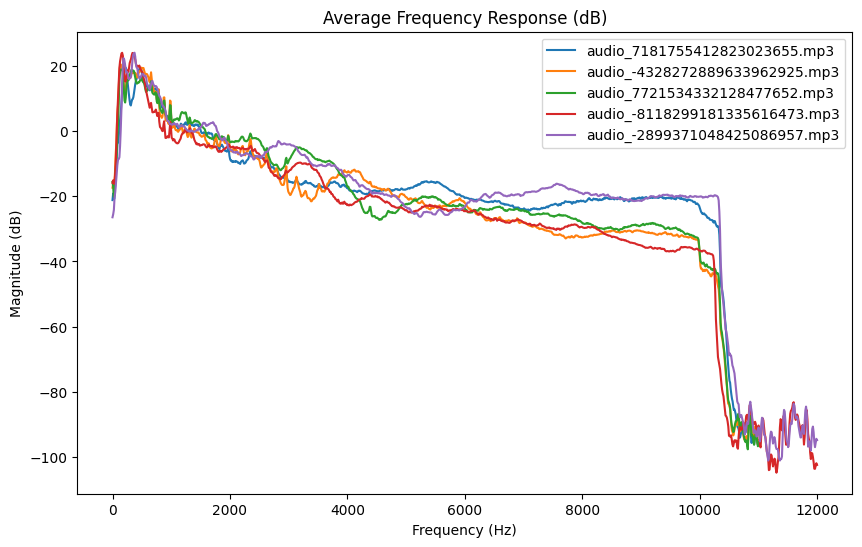

In [15]:
plt.figure(figsize=(10, 6))
for i, (freqs, avg_magnitude) in enumerate(freq_resp_list[:5]):  # Plotting first 5 as example
    plt.plot(freqs, 20 * np.log10(avg_magnitude + 1e-10), label=filenames[i])
plt.title("Average Frequency Response (dB)")
plt.xlabel("Frequency (Hz)")
plt.ylabel("Magnitude (dB)")
plt.legend()
plt.show

# Checking Total Number of Words in Audio and Text

In [9]:
import os
import random
import pandas as pd
import torch
from transformers import pipeline
import librosa
import matplotlib.pyplot as plt

# Set up the Whisper ASR pipeline
model_name = "openai/whisper-tiny" 
device = 0 if torch.cuda.is_available() else "cpu"
asr_pipe = pipeline("automatic-speech-recognition", model=model_name, device=device)

def count_words(text):
    return len(text.strip().split())

def transcribe_audio(file_path):
    audio, sr = librosa.load(file_path, sr=16000)
    result = asr_pipe(audio)
    transcript = result.get("text", "")
    return transcript

def process_csv(csv_path, audio_folder, sample_size=50):
    
    df = pd.read_csv(csv_path)
    
    # Ensure the 'audio' column is a string and filter out rows that don't have valid file names
    valid_df = df[df['audio'].apply(lambda x: isinstance(x, str) and os.path.isfile(os.path.join(audio_folder, x)))]
    
    # Randomly sample sample_size rows (or fewer if not enough valid files)
    sample_df = valid_df.sample(n=min(sample_size, len(valid_df)), random_state=42)
    
    results = []
    for idx, row in sample_df.iterrows():
        audio_file = row['audio']
        provided_transcript = row['text']
        file_path = os.path.join(audio_folder, audio_file)
        
        try:
            audio_transcript = transcribe_audio(file_path)
        except Exception as e:
            print(f"Error transcribing {audio_file}: {e}")
            continue
        
        provided_wc = count_words(provided_transcript)
        audio_wc = count_words(audio_transcript)
        flag = 1 if provided_wc == audio_wc else 0
        
        results.append({
            "audio_file": audio_file,
            "provided_word_count": provided_wc,
            "audio_word_count": audio_wc,
            "flag": flag
        })
        print(f"{audio_file}: Provided = {provided_wc}, Audio = {audio_wc}, Flag = {flag}")
    
    return pd.DataFrame(results)

# --- Set paths and process data ---
csv_path = "/kaggle/input/audio-text/SarvamAI/scraped_data.csv"      
audio_folder = "/kaggle/input/audio-text/SarvamAI/downloaded_audios"    

results_df = process_csv(csv_path, audio_folder, sample_size=25)




Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


audio_-5713399835812166986.mp3: Provided = 522, Audio = 558, Flag = 0
audio_-1839569025046019487.mp3: Provided = 443, Audio = 356, Flag = 0
audio_7721534332128477652.mp3: Provided = 514, Audio = 343, Flag = 0
audio_4068405469410780115.mp3: Provided = 54, Audio = 2, Flag = 0
Error transcribing audio_-5295868014944616208.mp3: float division by zero


/tmp/ipykernel_34/1543200919.py:18: UserWarning: PySoundFile failed. Trying audioread instead.
  audio, sr = librosa.load(file_path, sr=16000)
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.
/opt/conda/lib/python3.10/site-packages/librosa/core/audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


audio_1760138876266700825.mp3: Provided = 531, Audio = 455, Flag = 0
audio_-4472066442360585739.mp3: Provided = 541, Audio = 952, Flag = 0
audio_-3513326638279515542.mp3: Provided = 570, Audio = 108, Flag = 0
audio_-4661185780861304184.mp3: Provided = 495, Audio = 262, Flag = 0
audio_-1047219037668523916.mp3: Provided = 325, Audio = 323, Flag = 0
audio_-2899371048425086957.mp3: Provided = 1386, Audio = 1644, Flag = 0
audio_-8020525693325311575.mp3: Provided = 517, Audio = 605, Flag = 0
audio_1606751663680692398.mp3: Provided = 627, Audio = 989, Flag = 0
Error transcribing audio_3359209873589248685.mp3: 


Note: Illegal Audio-MPEG-Header 0x00000000 at offset 45834.
Note: Trying to resync...
Note: Hit end of (available) data during resync.
/tmp/ipykernel_34/1543200919.py:18: UserWarning: PySoundFile failed. Trying audioread instead.
  audio, sr = librosa.load(file_path, sr=16000)
/opt/conda/lib/python3.10/site-packages/librosa/core/audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


audio_4874154360181080560.mp3: Provided = 533, Audio = 369, Flag = 0
audio_-5082838192008871757.mp3: Provided = 649, Audio = 1241, Flag = 0
audio_-1306345190648135157.mp3: Provided = 612, Audio = 787, Flag = 0
Error transcribing audio_-3347006761165167899.mp3: float division by zero


/tmp/ipykernel_34/1543200919.py:18: UserWarning: PySoundFile failed. Trying audioread instead.
  audio, sr = librosa.load(file_path, sr=16000)
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.
/opt/conda/lib/python3.10/site-packages/librosa/core/audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


audio_-6836709713204690008.mp3: Provided = 431, Audio = 405, Flag = 0
Error transcribing audio_-7133236395561917882.mp3: float division by zero


/tmp/ipykernel_34/1543200919.py:18: UserWarning: PySoundFile failed. Trying audioread instead.
  audio, sr = librosa.load(file_path, sr=16000)
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.
/opt/conda/lib/python3.10/site-packages/librosa/core/audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


audio_2704296443855618939.mp3: Provided = 466, Audio = 549, Flag = 0
audio_7589781027285394541.mp3: Provided = 451, Audio = 532, Flag = 0
audio_8109654384526853059.mp3: Provided = 515, Audio = 691, Flag = 0


/tmp/ipykernel_34/1543200919.py:18: UserWarning: PySoundFile failed. Trying audioread instead.
  audio, sr = librosa.load(file_path, sr=16000)
/opt/conda/lib/python3.10/site-packages/librosa/core/audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)
[src/libmpg123/parse.c:skip_junk():1276] error: Giving up searching valid MPEG header after 65536 bytes of junk.


Error transcribing audio_-745876134296100784.mp3: float division by zero
audio_9138909480056537679.mp3: Provided = 508, Audio = 1383, Flag = 0


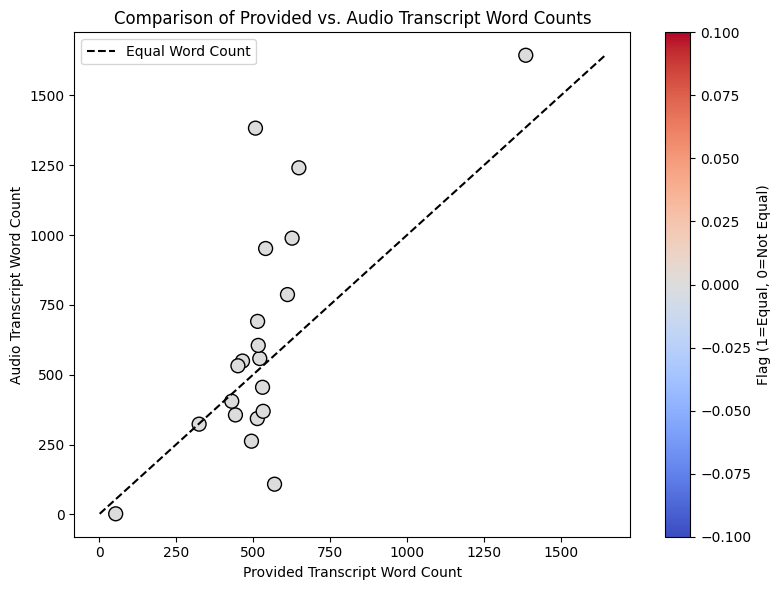

In [10]:
# --- Plotting the Results ---

# Scatter Plot: Provided vs. Audio word counts (color indicates flag)
plt.figure(figsize=(8, 6))
scatter = plt.scatter(results_df['provided_word_count'], results_df['audio_word_count'],
                      c=results_df['flag'], cmap='coolwarm', s=100, edgecolors='k')
plt.xlabel("Provided Transcript Word Count")
plt.ylabel("Audio Transcript Word Count")
plt.title("Comparison of Provided vs. Audio Transcript Word Counts")
plt.colorbar(scatter, label="Flag (1=Equal, 0=Not Equal)")
# Plot equality line
min_wc = min(results_df['provided_word_count'].min(), results_df['audio_word_count'].min())
max_wc = max(results_df['provided_word_count'].max(), results_df['audio_word_count'].max())
plt.plot([min_wc, max_wc], [min_wc, max_wc], 'k--', label='Equal Word Count')
plt.legend()
plt.tight_layout()
plt.show()